In [1]:
import torch
import torch.nn as nn

In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#!unzip /content/drive/MyDrive/Dataset/images.zip -d /content/drive/MyDrive/Dataset/

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 32
IMAGE_SIZE = 64
CHANNELS_IMG = 3
NOISE_DIM = 100
NUM_EPOCHS = 15
FEATURES_DISC = 64
FEATURES_GEN = 64

In [5]:
transforms = transforms.Compose(
    [
        transforms.Resize(IMAGE_SIZE),
        transforms.ToTensor(),
        transforms.Normalize(
            [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
        ),
    ]
)

In [6]:
dataset=datasets.ImageFolder(root="/content/drive/MyDrive/Dataset/images",transform=transforms)

In [7]:
dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [8]:
class Discriminator(nn.Module):
  def __init__(self,channels_img,features_d):
    super(Discriminator,self).__init__()
    self.disc =nn.Sequential(
        ## Input : N X channels_img X 64 X64
        nn.Conv2d(channels_img,features_d,kernel_size=4,stride=2,padding=1),## 32*32
        nn.LeakyReLU(0.2),
        self._block(features_d,features_d*2,4,2,1),##16*16
        self._block(features_d*2,features_d*4,4,2,1),
        self._block(features_d*4,features_d*8,4,2,1),
        nn.Conv2d(features_d*8,1,kernel_size=4,stride=2,padding=0),
        nn.Sigmoid()
    )

  def _block(self,in_channels,out_channels,kernel_size,stride,padding):
    return nn.Sequential(
        nn.Conv2d(in_channels,out_channels,kernel_size,stride,padding,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.LeakyReLU(0.2)
    )

  def forward(self,x):
    return self.disc(x)

In [9]:
class Generator(nn.Module):
  def __init__(self,z_dim,channels_img,features_g):
    super(Generator,self).__init__()
    self.net=nn.Sequential(## input 1*1
        self._block(z_dim,features_g*16,4,1,0),##N*f-g*16 X4X4
        self._block(features_g*16,features_g*8,4,2,1),##*X*
        self._block(features_g*8,features_g*4,4,2,1),
        self._block(features_g*4,features_g*2,4,2,1),
        nn.ConvTranspose2d(
            features_g*2,channels_img,kernel_size=4,stride=2,padding=1
        ),
        nn.Tanh() #[-1,1]
    )



  def _block(self,in_channels,out_channels,kernel_size,stride,padding):
    return nn.Sequential(
        nn.ConvTranspose2d(in_channels,out_channels,kernel_size,stride,padding,bias=False),
        nn.BatchNorm2d(out_channels),
        nn.ReLU()
    )

  def forward(self,x):
    return self.net(x)

In [10]:
def intialize_weights(model):
  for m in model.modules():
    if isinstance(m,(nn.Conv2d,nn.ConvTranspose2d,nn.BatchNorm2d)):
      nn.init.normal_(m.weight.data,0.0,0.02)

In [11]:
def test():
  N,in_channels,H,W=8,3,64,64
  z_dim=100
  x=torch.randn((N,in_channels,H,W))
  disc=Discriminator(in_channels,8)
  intialize_weights(disc)
  ## check dimenstions
  assert disc(x).shape==(N,1,1,1)
  gen=Generator(z_dim,in_channels,8)
  z=torch.randn((N,z_dim,1,1))
  assert gen(z).shape==(N,in_channels,H,W)
  print("Success")

In [12]:
test()

Success


In [13]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter


In [19]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LEARNING_RATE = 2e-4  # could also use two lrs, one for gen and one for disc
BATCH_SIZE = 128
IMAGE_SIZE = 64
CHANNELS_IMG = 3
NOISE_DIM = 100
NUM_EPOCHS = 5
FEATURES_DISC = 64
FEATURES_GEN = 64


In [11]:
# transforms = transforms.Compose(
#     [
#         transforms.Resize(IMAGE_SIZE),
#         transforms.ToTensor(),
#         transforms.Normalize(
#             [0.5 for _ in range(CHANNELS_IMG)], [0.5 for _ in range(CHANNELS_IMG)]
#         ),
#     ]
# )

In [17]:
# dataset = datasets.MNIST(
#     root="dataset/", train=True, transform=transforms, download=True
# )

In [44]:
# dataloader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [14]:
gen = Generator(NOISE_DIM, CHANNELS_IMG, FEATURES_GEN).to(device)
disc = Discriminator(CHANNELS_IMG, FEATURES_DISC).to(device)

In [15]:
intialize_weights(gen)
intialize_weights(disc)

opt_gen = optim.Adam(gen.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=LEARNING_RATE, betas=(0.5, 0.999))
criterion = nn.BCELoss()

fixed_noise = torch.randn(32, NOISE_DIM, 1, 1).to(device)
writer_real = SummaryWriter(f"logs/real")
writer_fake = SummaryWriter(f"logs/fake")
step = 0

gen.train()
disc.train()

Discriminator(
  (disc): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2))
    (6): Sigmoid()
  )
)

In [16]:
!pip install tensorboard

In [16]:
for epoch in range(NUM_EPOCHS):
    # Target labels not needed! <3 unsupervised
    for batch_idx, (real, _) in enumerate(dataloader):
        real = real.to(device)
        noise = torch.randn(BATCH_SIZE, NOISE_DIM, 1, 1).to(device)
        fake = gen(noise)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        disc_real = disc(real).reshape(-1)
        loss_disc_real = criterion(disc_real, torch.ones_like(disc_real))
        disc_fake = disc(fake.detach()).reshape(-1)
        loss_disc_fake = criterion(disc_fake, torch.zeros_like(disc_fake))
        loss_disc = (loss_disc_real + loss_disc_fake) / 2
        disc.zero_grad()
        loss_disc.backward()
        opt_disc.step()

        ### Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        output = disc(fake).reshape(-1)
        loss_gen = criterion(output, torch.ones_like(output))
        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Print losses occasionally and print to tensorboard
        if batch_idx % 100 == 0:
            print(
                f"Epoch [{epoch}/{NUM_EPOCHS}] Batch {batch_idx}/{len(dataloader)} \
                  Loss D: {loss_disc:.4f}, loss G: {loss_gen:.4f}"
            )

            with torch.no_grad():
                fake = gen(fixed_noise)
                # take out (up to) 32 examples
                img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
                img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

                writer_real.add_image("Real", img_grid_real, global_step=step)
                writer_fake.add_image("Fake", img_grid_fake, global_step=step)

            step += 1

Epoch [0/15] Batch 0/621                   Loss D: 0.6912, loss G: 0.7983
Epoch [0/15] Batch 100/621                   Loss D: 0.0492, loss G: 3.5761
Epoch [0/15] Batch 200/621                   Loss D: 0.3603, loss G: 1.5919
Epoch [0/15] Batch 300/621                   Loss D: 0.4364, loss G: 2.2451
Epoch [0/15] Batch 400/621                   Loss D: 0.6239, loss G: 1.9428
Epoch [0/15] Batch 500/621                   Loss D: 0.3928, loss G: 3.8520
Epoch [0/15] Batch 600/621                   Loss D: 0.4594, loss G: 2.8487
Epoch [1/15] Batch 0/621                   Loss D: 0.3996, loss G: 2.6768
Epoch [1/15] Batch 100/621                   Loss D: 0.7102, loss G: 3.9700
Epoch [1/15] Batch 200/621                   Loss D: 0.5268, loss G: 2.1522
Epoch [1/15] Batch 300/621                   Loss D: 0.5760, loss G: 3.6696
Epoch [1/15] Batch 400/621                   Loss D: 0.4449, loss G: 1.5793
Epoch [1/15] Batch 500/621                   Loss D: 0.5035, loss G: 2.4778
Epoch [1/15] Bat

In [17]:
%load_ext tensorboard
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

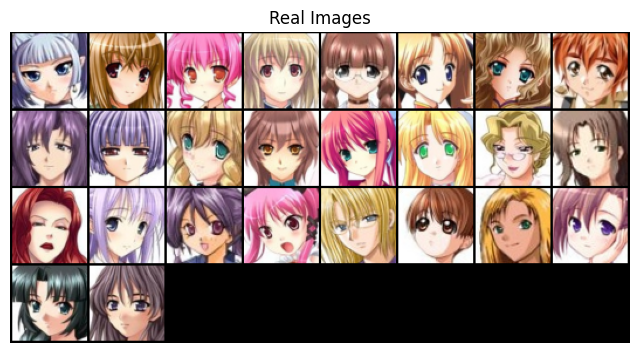

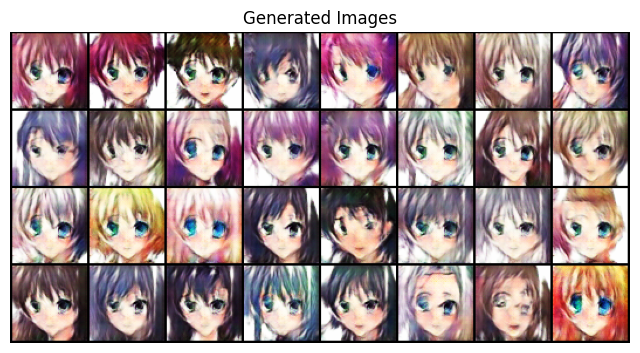

In [18]:
import matplotlib.pyplot as plt

fixed_noise = torch.randn(32, NOISE_DIM, 1, 1).to(device)
with torch.no_grad():
  fake = gen(fixed_noise)
  img_grid_real = torchvision.utils.make_grid(real[:32], normalize=True)
  img_grid_fake = torchvision.utils.make_grid(fake[:32], normalize=True)

  # Plot the real images
  plt.figure(figsize=(8, 8))
  plt.imshow(img_grid_real.cpu().permute(1, 2, 0))  # Convert to CPU and correct channel order
  plt.title("Real Images")
  plt.axis("off")  # Hide axes ticks and labels
  plt.show()

  # Plot the generated images
  plt.figure(figsize=(8, 8))
  plt.imshow(img_grid_fake.cpu().permute(1, 2, 0))  # Convert to CPU and correct channel order
  plt.title("Generated Images")
  plt.axis("off")  # Hide axes ticks and labels
  plt.show()
